<a href="https://colab.research.google.com/github/Lucs1590/study_segmentation/blob/main/point_rend_technique.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# PointRend Technique

- https://arxiv.org/pdf/1912.08193.pdf

# Detectron2 Installation

In [ ]:
!git clone https://github.com/facebookresearch/detectron2.git

fatal: destination path 'detectron2' already exists and is not an empty directory.


In [ ]:
!pip install ./detectron2

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Processing ./detectron2
  DEPRECATION: A future pip version will change local packages to be built in-place without first copying to a temporary directory. We recommend you use --use-feature=in-tree-build to test your packages with this new behavior before it becomes the default.
   pip 21.3 will remove support for this functionality. You can find discussion regarding this at https://github.com/pypa/pip/issues/7555.
ERROR: Operation cancelled by user
Traceback (most recent call last):
  File "/usr/local/bin/pip3", line 8, in <module>
    sys.exit(main())
  File "/usr/local/lib/python3.7/dist-packages/pip/_internal/cli/main.py", line 71, in main
    return command.main(cmd_args)
  File "/usr/local/lib/python3.7/dist-packages/pip/_internal/cli/base_command.py", line 104, in main
    return self._main(args)
  File "/usr/lib/python3.7/contextlib.py", line 119, in __exit__
    next(self.gen)
 

In [ ]:
!pip install --upgrade pyyaml

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
#!pip install pyyaml==5.1
#
#import torch, torchvision
#print(torch.__version__, torch.cuda.is_available()) # Confere a instalação do Pytorch
#
## Clona o repositório para acessar as configurações pré-definidas do PointRend
#!git clone --branch v0.6 https://github.com/facebookresearch/detectron2.git detectron2_repo
#
##Instala o Detectron2
#!pip install -e detectron2_repo

In [ ]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

<Logger detectron2 (DEBUG)>

In [ ]:
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer, ColorMode
from detectron2.data import MetadataCatalog

In [ ]:
coco_metadata = MetadataCatalog.get('coco_2017_val')

In [ ]:
from detectron2.projects import point_rend

In [ ]:
import numpy as np
import cv2
import torch
from google.colab.patches import cv2_imshow
from skimage.io import imread
import matplotlib.pyplot as plt

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
!cp -r /content/gdrive/MyDrive/image-segmentation-course/fotos /content/images/

# Setting Mask-RCNN

In [ ]:
config = get_cfg()
config.merge_from_file(model_zoo.get_config_file('COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml'))

In [ ]:
config.MODEL.WEIGHTS = model_zoo.get_checkpoint_url('COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml')

In [ ]:
config.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5

In [ ]:
config.MODEL.DEVIDE = 'cuda'

# Test image loading

(533, 800, 3)


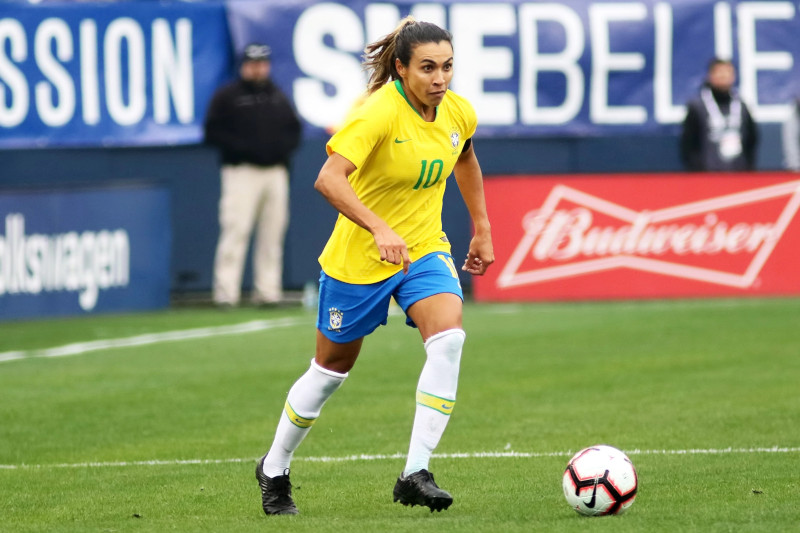

In [ ]:
img = cv2.imread('images/futebol01.jpg')
print(img.shape)
cv2_imshow(img)

# Image Segmentation

In [ ]:
mask_rcnn_predictor = DefaultPredictor(config)
output_mask_rcnn = mask_rcnn_predictor(img)

In [ ]:
output_mask_rcnn

{'instances': Instances(num_instances=4, image_height=533, image_width=800, fields=[pred_boxes: Boxes(tensor([[247.7753,  12.7181, 496.9373, 517.2999],
         [561.8361, 444.1704, 637.9968, 517.8873],
         [202.7191,  43.0546, 304.0631, 309.8472],
         [678.0729,  61.0229, 759.0398, 168.9045]], device='cuda:0')), scores: tensor([0.9994, 0.9990, 0.9979, 0.9897], device='cuda:0'), pred_classes: tensor([ 0, 32,  0,  0], device='cuda:0'), pred_masks: tensor([[[False, False, False,  ..., False, False, False],
          [False, False, False,  ..., False, False, False],
          [False, False, False,  ..., False, False, False],
          ...,
          [False, False, False,  ..., False, False, False],
          [False, False, False,  ..., False, False, False],
          [False, False, False,  ..., False, False, False]],
 
         [[False, False, False,  ..., False, False, False],
          [False, False, False,  ..., False, False, False],
          [False, False, False,  ..., Fals

In [ ]:
rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
visualizer = Visualizer(rgb, coco_metadata, scale=1)
mask_rcnn_result = visualizer.draw_instance_predictions(output_mask_rcnn['instances'].to('cpu')).get_image()

In [ ]:
def show_img(img):
  fig = plt.gcf()
  fig.set_size_inches(14, 10)
  plt.axis("off")
  plt.imshow(img)
  plt.show()

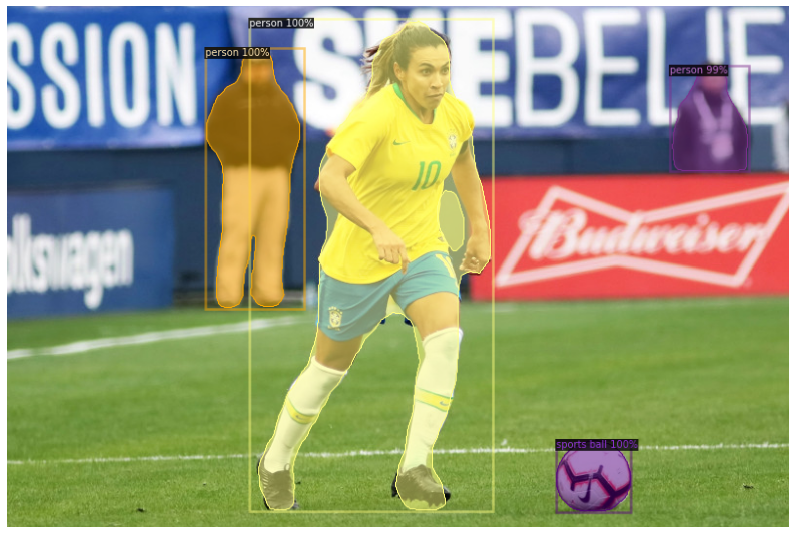

In [ ]:
show_img(mask_rcnn_result)

# Setting PointRend

In [ ]:
cfg = get_cfg()
point_rend.add_pointrend_config(cfg)

In [ ]:
cfg.merge_from_file('/content/detectron2/projects/PointRend/configs/InstanceSegmentation/pointrend_rcnn_X_101_32x8d_FPN_3x_coco.yaml')
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5

In [ ]:
cfg.MODEL.WEIGHTS = 'detectron2://PointRend/InstanceSegmentation/pointrend_rcnn_X_101_32x8d_FPN_3x_coco/28119989/model_final_ba17b9.pkl'

In [ ]:
cfg.MODEL.DEVICE = 'cuda'

In [ ]:
predictor = DefaultPredictor(cfg)

model_final_ba17b9.pkl: 495MB [01:10, 6.97MB/s]                           


WARNING [07/13 01:47:56 d2.projects.point_rend.mask_head]: Weight format of PointRend models have changed! Applying automatic conversion now ...


The checkpoint state_dict contains keys that are not used by the model:
  pixel_mean
  pixel_std


# PointRend Segmentation

In [ ]:
point_rend_output = predictor(img)

/usr/local/lib/python3.7/dist-packages/detectron2/projects/point_rend/point_features.py:142: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  point_coords[:, :, 1] = h_step / 2.0 + (point_indices // W).to(torch.float) * h_step


In [ ]:
point_rend_output['instances']

Instances(num_instances=4, image_height=533, image_width=800, fields=[pred_boxes: Boxes(tensor([[249.8990,  16.5392, 495.9810, 520.4473],
        [561.8973, 444.0751, 638.3247, 517.2474],
        [202.7926,  42.6757, 302.1481, 309.6065],
        [681.5095,  58.0248, 758.4286, 171.6117]], device='cuda:0')), scores: tensor([0.9984, 0.9983, 0.9970, 0.9922], device='cuda:0'), pred_classes: tensor([ 0, 32,  0,  0], device='cuda:0'), pred_masks: tensor([[[False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         ...,
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False]],

        [[False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         

In [ ]:
rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
visualizer = Visualizer(rgb, coco_metadata, scale=1)
point_rend_result = visualizer.draw_instance_predictions(point_rend_output['instances'].to('cpu')).get_image()

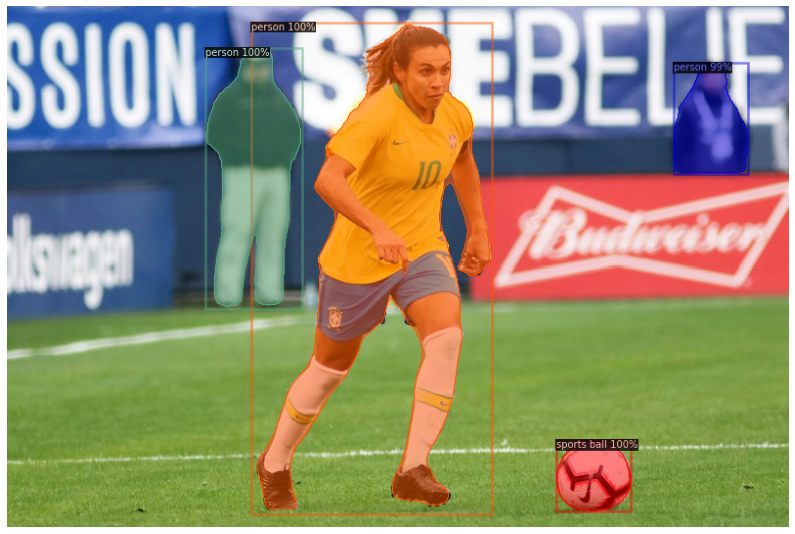

In [ ]:
show_img(point_rend_result)

# Comparison of Results

In [ ]:
def show_comparision(img1, img2):
  fig = plt.figure(figsize=(20, 14))

  fig.add_subplot(1,2,1)
  plt.imshow(img1)
  plt.axis("off")
  plt.title("Mask R-CNN");

  plt.subplot(1,2,2)
  plt.imshow(img2)
  plt.axis("off")
  plt.title("Mask R-CNN + PointRend");

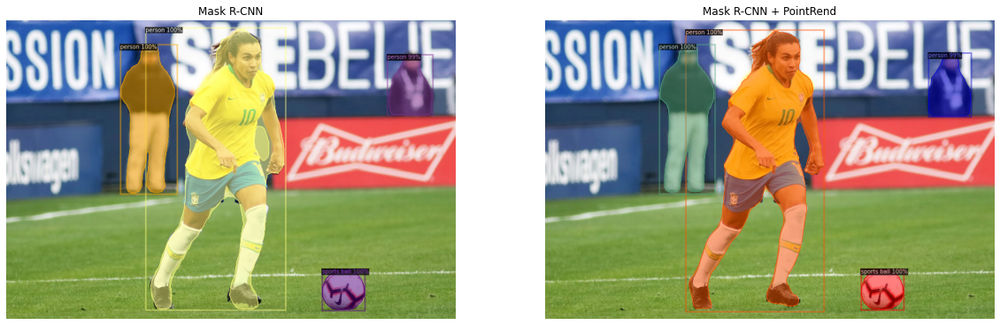

In [ ]:
show_comparision(mask_rcnn_result,point_rend_result)

WARNING [07/13 02:07:02 d2.projects.point_rend.mask_head]: Weight format of PointRend models have changed! Applying automatic conversion now ...


The checkpoint state_dict contains keys that are not used by the model:
  pixel_mean
  pixel_std
/usr/local/lib/python3.7/dist-packages/detectron2/projects/point_rend/point_features.py:142: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  point_coords[:, :, 1] = h_step / 2.0 + (point_indices // W).to(torch.float) * h_step
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


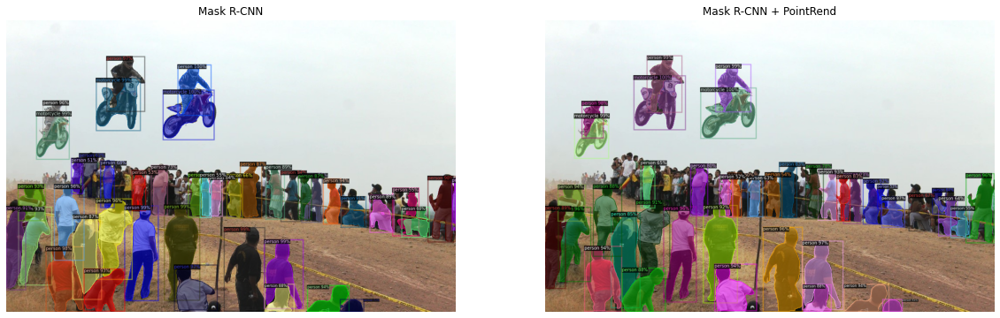

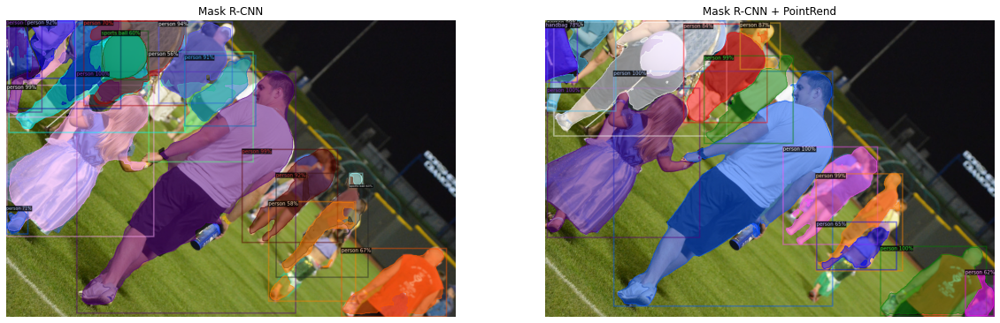

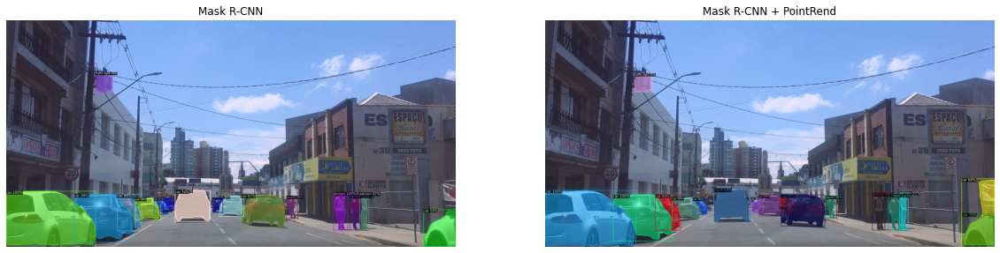

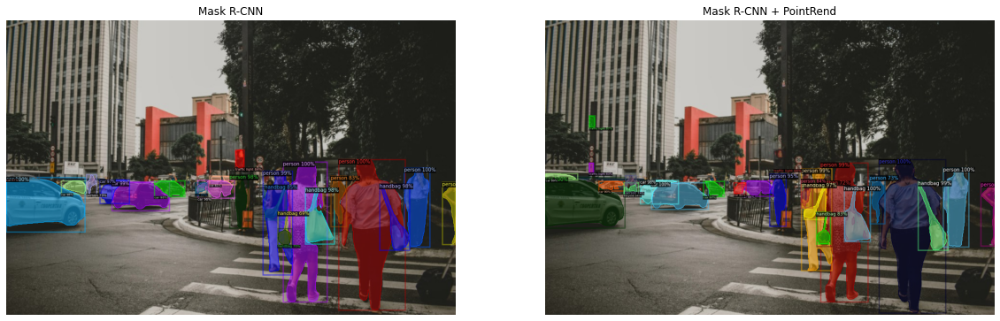

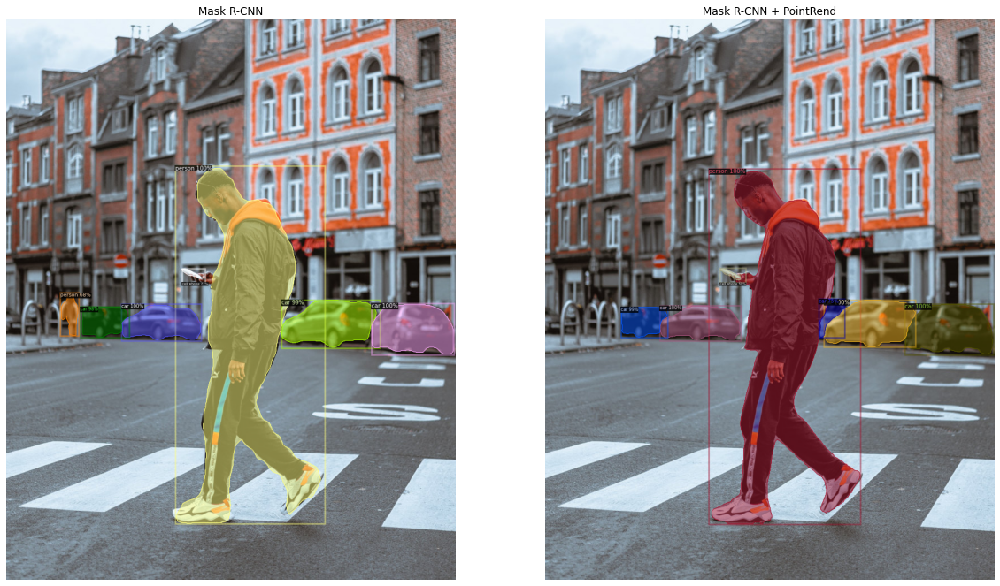

...

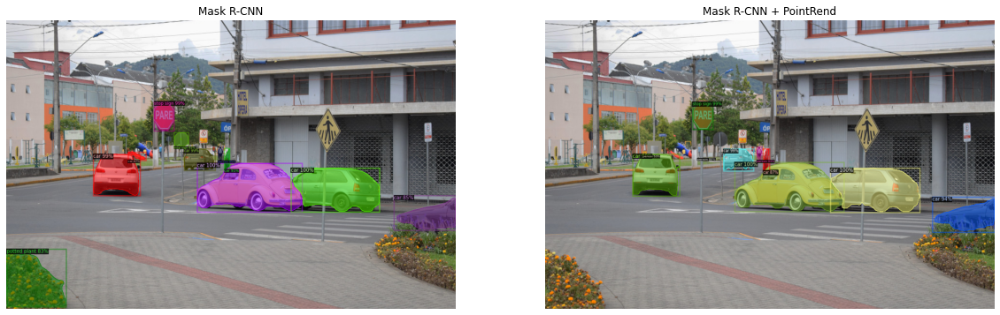

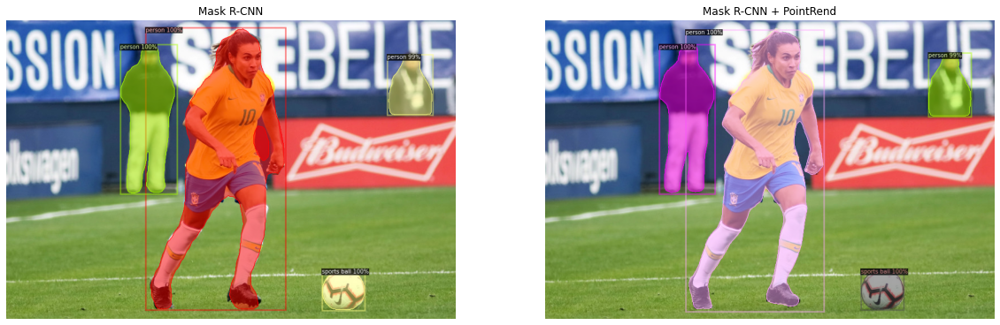

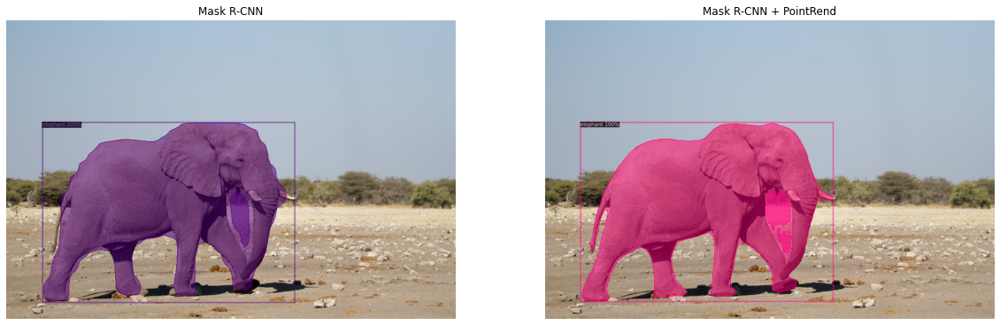

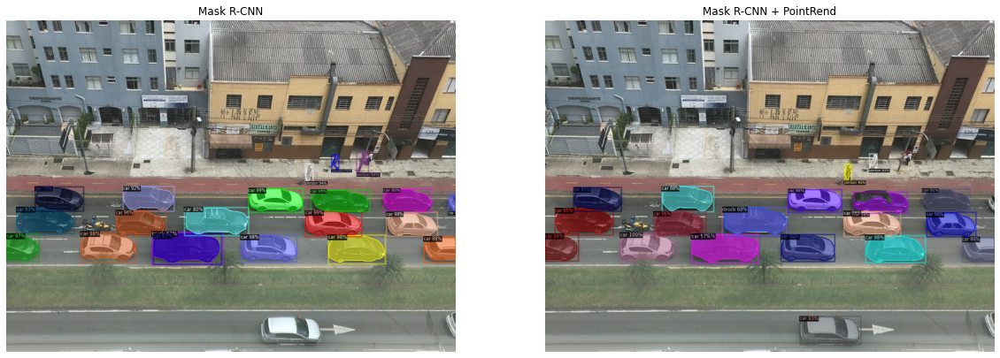

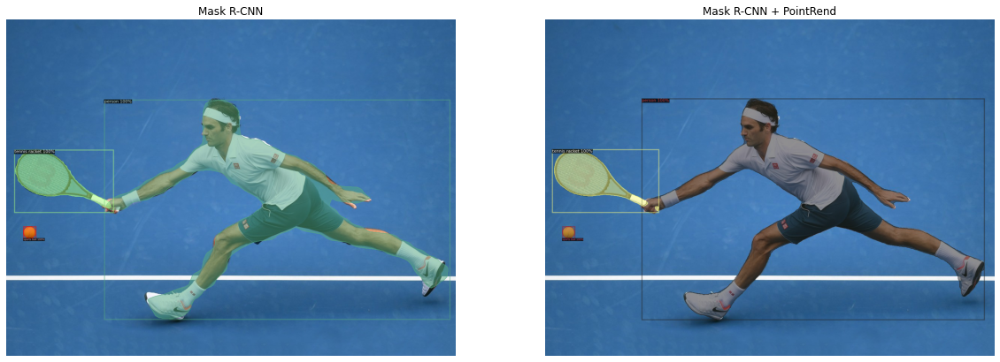

In [49]:
import os
mask_rcnn_predictor = DefaultPredictor(config)
point_rend_predictor = DefaultPredictor(cfg)

for img in os.listdir('/content/images'):
  img = cv2.imread(f'/content/images/{img}')

  output_mask_rcnn = mask_rcnn_predictor(img)
  rgb_mask_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  visualizer = Visualizer(rgb_mask_img, coco_metadata, scale=1)
  mask_rcnn_result = visualizer.draw_instance_predictions(output_mask_rcnn['instances'].to('cpu')).get_image()

  point_rend_output = point_rend_predictor(img)
  rgb_point_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  visualizer = Visualizer(rgb_point_img, coco_metadata, scale=1)
  point_rend_result = visualizer.draw_instance_predictions(point_rend_output['instances'].to('cpu')).get_image()

  show_comparision(mask_rcnn_result, point_rend_result)